<a href="https://colab.research.google.com/github/eytanbab/Global-Cost-of-Living-Project/blob/main/Global_Cost_of_Living_Analysis_Project_V6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import libaries and datasets:

In [ ]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
from pylab import rcParams
import seaborn as sb

import networkx as nx
from tqdm import tqdm
%matplotlib inline

In [ ]:
# kaggle dataset to know each column meaning:
# https://www.kaggle.com/datasets/mvieira101/global-cost-of-living

In [ ]:
!mkdir /root/.kaggle/
import json
import os

# Installing the Kaggle package
!pip install kaggle 

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token = {"username":"eytanbabaev","key":"6e0af9dfecaab348d887df10326e3a77"}

# creating kaggle.json file with the personal API-Key details 
# You can also put this file on your Google Drive
with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle/’: File exists
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Creating a dataset directory

!mkdir ./datasets
!mkdir ./datasets/global-cost-of-living

# download the dataset from Kaggle and unzip it
!kaggle datasets download mvieira101/global-cost-of-living  -p ./datasets/global-cost-of-living/
!unzip ./datasets/global-cost-of-living/*.zip  -d ./datasets/global-cost-of-living
!ls ./datasets/global-cost-of-living


mkdir: cannot create directory ‘./datasets’: File exists
mkdir: cannot create directory ‘./datasets/global-cost-of-living’: File exists
global-cost-of-living.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  ./datasets/global-cost-of-living/global-cost-of-living.zip
replace ./datasets/global-cost-of-living/cost-of-living.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
cost-of-living.csv  cost-of-living_v2.csv  global-cost-of-living.zip


In [ ]:
# Creating a dataset directory
!mkdir ./datasets/country-to-continent
!ls /content/datasets/country-to-continent
!cd /content/datasets/country-to-continent

# download the dataset from Kaggle and unzip it
!kaggle datasets download statchaitya/country-to-continent -p /content/datasets/country-to-continent
!unzip /content/datasets/country-to-continent/*.zip  -d /content/datasets/country-to-continent

mkdir: cannot create directory ‘./datasets/country-to-continent’: File exists
countryContinent.csv  country-to-continent.zip
country-to-continent.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  /content/datasets/country-to-continent/country-to-continent.zip
replace /content/datasets/country-to-continent/countryContinent.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


#Load data:




In [ ]:
# Load data:
df = pd.read_csv("/content/datasets/global-cost-of-living/cost-of-living.csv",index_col = 0)

# Filter df to only have countries with data quality = 1
df = df[df['data_quality'] == 1]

# Group df by each country's mean
df = df.groupby(['country']).mean()

# Reset index
df = df.reset_index()

df

,country,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x47,x48,x49,x50,x51,x52,x53,x54,x55,data_quality
0,Afghanistan,1.670000,5.560000,3.060000,NaN,NaN,0.920000,0.220000,0.130000,0.590000,...,35.5600,107.120000,63.900000,238.930000,144.470000,683.440000,350.050000,192.620000,13.880000,1.0
1,Albania,5.140000,27.896667,4.403333,1.613333,2.053333,1.196667,1.223333,0.546667,1.326667,...,88.3000,304.536667,169.703333,503.256667,305.000000,1357.740000,673.040000,391.076667,4.570000,1.0
2,Algeria,2.527500,17.150000,3.520000,1.417500,1.830000,0.612500,0.447500,0.192500,0.760000,...,79.6625,169.580000,98.967500,303.630000,201.665000,1444.040000,849.320000,248.457500,6.776667,1.0
3,Argentina,5.700000,22.500000,5.370000,1.645000,2.450000,1.625000,1.010000,0.855000,0.790000,...,94.8800,261.645000,201.670000,497.455000,388.590000,1800.810000,1437.225000,459.085000,47.115000,1.0
4,Armenia,7.500000,37.520000,6.950000,1.500000,2.250000,2.840000,0.940000,0.470000,1.370000,...,98.5500,965.500000,650.540000,1556.730000,925.630000,2353.850000,1103.100000,513.020000,12.110000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136,Venezuela,10.000000,50.000000,10.000000,1.500000,2.250000,1.740000,1.070000,0.810000,1.830000,...,66.0800,383.330000,322.220000,831.250000,587.500000,805.570000,1140.960000,196.110000,27.000000,1.0
137,Vietnam,2.423333,20.473333,4.563333,0.976667,1.820000,1.866667,0.476667,0.286667,1.373333,...,93.6100,388.313333,250.636667,925.586667,530.906667,2820.496667,1373.863333,426.676667,11.130000,1.0
138,Yemen,5.990000,17.980000,9.000000,2.000000,1.800000,2.900000,1.050000,0.720000,2.010000,...,56.4800,204.850000,115.630000,487.110000,283.550000,2787.570000,1015.790000,599.670000,12.500000,1.0
139,Zambia,3.000000,18.370000,3.170000,1.220000,1.500000,1.810000,0.880000,0.470000,1.340000,...,105.6400,262.010000,168.400000,832.640000,509.970000,10763.910000,NaN,396.940000,26.000000,1.0


# ---------------------------------------------------------------------------------------------------------------------------

# Percentage of each column to salary df:


In [ ]:
# Percentage of each column to salary
df_percentage = df['country'].to_frame()
for i in range(1, 54):
    df_percentage[f'%x{i}'] =  df[f'x{i}'] / df['x54'] * 100
df_percentage

,country,%x1,%x2,%x3,%x4,%x5,%x6,%x7,%x8,%x9,...,%x44,%x45,%x46,%x47,%x48,%x49,%x50,%x51,%x52,%x53
0,Afghanistan,0.866992,2.886512,1.588620,NaN,NaN,0.477624,0.114215,0.067490,0.306303,...,9.230609,8.862008,15.574707,18.461219,55.612086,33.174125,124.042156,75.002596,354.812584,181.730869
1,Albania,1.314320,7.133299,1.125951,0.412536,0.525046,0.305993,0.312812,0.139785,0.339234,...,9.228370,7.923425,16.238930,22.578693,77.871347,43.393878,128.684913,77.989823,347.180007,172.099247
2,Algeria,1.017277,6.902589,1.416741,0.570520,0.736544,0.246521,0.180111,0.077478,0.305887,...,13.725687,16.338810,27.178693,32.062828,68.253122,39.832768,122.206011,81.166799,581.202016,341.837135
3,Argentina,1.241600,4.901053,1.169718,0.358321,0.533670,0.353965,0.220003,0.186240,0.172081,...,14.372066,10.144091,21.389285,20.667197,56.992714,43.928684,108.357929,84.644456,392.260692,313.062940
4,Armenia,1.461931,7.313555,1.354723,0.292386,0.438579,0.553585,0.183229,0.091614,0.267046,...,14.492612,9.748158,21.591751,19.209777,188.199290,126.805972,303.444310,180.427664,458.822268,215.020857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136,Venezuela,5.099179,25.495895,5.099179,0.764877,1.147315,0.887257,0.545612,0.413034,0.933150,...,21.125899,20.396716,36.117485,33.695375,195.466830,164.305747,423.869257,299.576768,410.774565,581.795931
137,Vietnam,0.567955,4.798325,1.069506,0.228901,0.426553,0.437490,0.111716,0.067186,0.321867,...,8.067780,7.760756,20.523738,21.939330,91.008804,58.741592,216.929291,124.428334,661.038413,321.991672
138,Yemen,0.998883,2.998316,1.500825,0.333517,0.300165,0.483599,0.175096,0.120066,0.335184,...,11.106108,16.327313,12.721997,9.418514,34.160455,19.282272,81.229676,47.284340,464.850668,169.391499
139,Zambia,0.755782,4.627903,0.798609,0.307351,0.377891,0.455988,0.221696,0.118406,0.337583,...,3.189399,7.839976,22.718799,26.613594,66.007457,42.424548,209.764700,128.475336,2711.722175,NaN



# Adding continent to perecntage df:

In [ ]:
# load data:
df_continent = pd.read_csv("/content/datasets/country-to-continent/countryContinent.csv", encoding="ISO-8859-1")
df_continent = df_continent[['country','continent']]
df_country_continent_dict = {}

for index,rows in df_continent.iterrows():
  df_country_continent_dict[f'{rows.country}'] = rows.continent

#Add missing countries (has different names in each df):
df_percentage.at[16,'continent'] = "Americas"
df_percentage.at[17,'continent'] = "Europe"
df_percentage.at[18,'continent'] = "Asia"
df_percentage.at[20,'continent'] = "Asia"
df_percentage.at[54,'continent'] = "Asia"
df_percentage.at[57,'continent'] = "Europe"
df_percentage.at[79,'continent'] = "Europe"
df_percentage.at[103,'continent'] = "Asia"
df_percentage.at[114,'continent'] = "Asia"
df_percentage.at[120,'continent'] = "Asia"
df_percentage.at[121,'continent'] = "Asia"
df_percentage.at[123,'continent'] = "Africa"
df_percentage.at[125,'continent'] = "Americas"
df_percentage.at[131,'continent'] = "Europe"
df_percentage.at[132,'continent'] = "Americas"
df_percentage.at[136,'continent'] = "Americas"
df_percentage.at[137,'continent'] = "Asia"

for index,rows in df_percentage.iterrows():
  if rows.country in df_country_continent_dict.keys():
    df_percentage.at[index,'continent']=df_country_continent_dict[rows.country]

df_percentage

,country,%x1,%x2,%x3,%x4,%x5,%x6,%x7,%x8,%x9,...,%x45,%x46,%x47,%x48,%x49,%x50,%x51,%x52,%x53,continent
0,Afghanistan,0.866992,2.886512,1.588620,NaN,NaN,0.477624,0.114215,0.067490,0.306303,...,8.862008,15.574707,18.461219,55.612086,33.174125,124.042156,75.002596,354.812584,181.730869,Asia
1,Albania,1.314320,7.133299,1.125951,0.412536,0.525046,0.305993,0.312812,0.139785,0.339234,...,7.923425,16.238930,22.578693,77.871347,43.393878,128.684913,77.989823,347.180007,172.099247,Europe
2,Algeria,1.017277,6.902589,1.416741,0.570520,0.736544,0.246521,0.180111,0.077478,0.305887,...,16.338810,27.178693,32.062828,68.253122,39.832768,122.206011,81.166799,581.202016,341.837135,Africa
3,Argentina,1.241600,4.901053,1.169718,0.358321,0.533670,0.353965,0.220003,0.186240,0.172081,...,10.144091,21.389285,20.667197,56.992714,43.928684,108.357929,84.644456,392.260692,313.062940,Americas
4,Armenia,1.461931,7.313555,1.354723,0.292386,0.438579,0.553585,0.183229,0.091614,0.267046,...,9.748158,21.591751,19.209777,188.199290,126.805972,303.444310,180.427664,458.822268,215.020857,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136,Venezuela,5.099179,25.495895,5.099179,0.764877,1.147315,0.887257,0.545612,0.413034,0.933150,...,20.396716,36.117485,33.695375,195.466830,164.305747,423.869257,299.576768,410.774565,581.795931,Americas
137,Vietnam,0.567955,4.798325,1.069506,0.228901,0.426553,0.437490,0.111716,0.067186,0.321867,...,7.760756,20.523738,21.939330,91.008804,58.741592,216.929291,124.428334,661.038413,321.991672,Asia
138,Yemen,0.998883,2.998316,1.500825,0.333517,0.300165,0.483599,0.175096,0.120066,0.335184,...,16.327313,12.721997,9.418514,34.160455,19.282272,81.229676,47.284340,464.850668,169.391499,Asia
139,Zambia,0.755782,4.627903,0.798609,0.307351,0.377891,0.455988,0.221696,0.118406,0.337583,...,7.839976,22.718799,26.613594,66.007457,42.424548,209.764700,128.475336,2711.722175,NaN,Africa


In [ ]:
df_percentage[['country','continent']]

,country,continent
0,Afghanistan,Asia
1,Albania,Europe
2,Algeria,Africa
3,Argentina,Americas
4,Armenia,Asia
...,...,...
136,Venezuela,Americas
137,Vietnam,Asia
138,Yemen,Asia
139,Zambia,Africa


In [ ]:
# Updating country_continent dictionary with missing countries:
df_country_continent_dict = dict(zip(df_percentage['country'],df_percentage['continent']))
df_country_continent_dict

{'Afghanistan': 'Asia',
 'Albania': 'Europe',
 'Algeria': 'Africa',
 'Argentina': 'Americas',
 'Armenia': 'Asia',
 'Australia': 'Oceania',
 'Austria': 'Europe',
 'Azerbaijan': 'Asia',
 'Bahrain': 'Asia',
 'Bangladesh': 'Asia',
 'Barbados': 'Americas',
 'Belarus': 'Europe',
 'Belgium': 'Europe',
 'Belize': 'Americas',
 'Bermuda': 'Americas',
 'Bhutan': 'Asia',
 'Bolivia': 'Americas',
 'Bosnia And Herzegovina': 'Europe',
 'Botswana': 'Africa',
 'Brazil': 'Americas',
 'Brunei': 'Asia',
 'Bulgaria': 'Europe',
 'Cambodia': 'Asia',
 'Cameroon': 'Africa',
 'Canada': 'Americas',
 'Chile': 'Americas',
 'China': 'Asia',
 'Colombia': 'Americas',
 'Costa Rica': 'Americas',
 'Croatia': 'Europe',
 'Cuba': 'Americas',
 'Cyprus': 'Asia',
 'Denmark': 'Europe',
 'Dominican Republic': 'Americas',
 'Ecuador': 'Americas',
 'Egypt': 'Africa',
 'Estonia': 'Europe',
 'Ethiopia': 'Africa',
 'Fiji': 'Oceania',
 'Finland': 'Europe',
 'France': 'Europe',
 'Georgia': 'Asia',
 'Germany': 'Europe',
 'Ghana': 'Africa

# Creating tripartite Graph:

In [248]:
# Create a new graph:
B = nx.Graph() 

# Add countries as nodes with bipartite = 0:
B.add_nodes_from(list(df_percentage.country), bipartite=0) 

# Add categories as nodes with bipartite = 1:
B.add_nodes_from(['high','medium','low'], bipartite=1)

# list for each category: 
high_list=[]
med_list=[]
low_list=[]

In [249]:
# Add continent as nodes with bipartite = 2
B.add_nodes_from(list(df_percentage.continent), bipartite=2)

# Add an edge between each country and its continent
for index,rows in df_percentage.iterrows():
  B.add_edge(rows.continent, rows.country)

In [250]:
# Save country_continent edges for later:
country_continent_edges = B.edges()

## Adding data to graph:

### **Meal, Inexpensive Restaurant (USD):**

In [251]:
# get the mean value of %x1 column:
x1_percentage_mean = df_percentage.mean(numeric_only = True)['%x1']

# low range price will be 70% of the mean value
low_range_price = x1_percentage_mean*0.7

# high range price will be 130% of the mean value
high_range_price = x1_percentage_mean * 1.3
# connecting each country to its corresponding category:
for index, rows in tqdm(df_percentage.iterrows()):
  if int(rows["%x1"]) >= high_range_price:
    B.add_edges_from([(rows.country,'high')])
    high_list.append(rows.country)

  elif int(rows["%x1"]) < high_range_price and int(rows["%x1"]) > low_range_price:
    B.add_edges_from([(rows.country,'medium')])
    med_list.append(rows.country)

  else:
    B.add_edges_from([(rows.country,'low')])
    low_list.append(rows.country)

141it [00:00, 10556.70it/s]


### **McMeal at McDonalds (or Equivalent Combo Meal) (USD): (column x3)**

In [252]:
# get the mean value of %x3 column:
x3_percentage_mean = df_percentage.mean(numeric_only = True)['%x3']

# low range price will be 70% of the mean value
low_range_price = x3_percentage_mean*0.7

# high range price will be 130% of the mean value
high_range_price = x3_percentage_mean * 1.3

# connecting each country to its corresponding category:
for index, rows in tqdm(df_percentage.iterrows()):
  if int(rows["%x3"]) >= high_range_price:
    B.add_edges_from([(rows.country,'high')])
    high_list.append(rows.country)

  elif int(rows["%x3"]) < high_range_price and int(rows["%x3"]) > low_range_price:
    B.add_edges_from([(rows.country,'medium')])
    med_list.append(rows.country)

  else:
    B.add_edges_from([(rows.country,'low')])
    low_list.append(rows.country)

141it [00:00, 10555.00it/s]


### **Water (1.5 liter bottle, at the market) (USD): (column x23)**

In [253]:
# get the mean value of %x23 column:
x23_percentage_mean = df_percentage.mean(numeric_only = True)['%x23']

# low range price will be 70% of the mean value
low_range_price = x23_percentage_mean*0.7

# high range price will be 130% of the mean value
high_range_price = x23_percentage_mean * 1.3

# connecting each country to its corresponding category:
for index, rows in tqdm(df_percentage.iterrows()):
  if int(rows["%x23"]) >= high_range_price:
    B.add_edges_from([(rows.country,'high')])
    high_list.append(rows.country)

  elif int(rows["%x23"]) < high_range_price and int(rows["%x23"]) > low_range_price:
    B.add_edges_from([(rows.country,'medium')])
    med_list.append(rows.country)

  else:
    B.add_edges_from([(rows.country,'low')])
    low_list.append(rows.country)

141it [00:00, 11376.74it/s]


###**Gasoline (1 liter) (USD) (column x33)**

In [254]:
# get the mean value of %x33 column:
x33_percentage_mean = df_percentage.mean(numeric_only = True)['%x33']

# low range price will be 70% of the mean value
low_range_price = x33_percentage_mean*0.7

# high range price will be 130% of the mean value
high_range_price = x33_percentage_mean * 1.3

# connecting each country to its corresponding category:
for index, rows in tqdm(df_percentage.iterrows()):
  if int(rows["%x33"]) >= high_range_price:
    B.add_edges_from([(rows.country,'high')])
    high_list.append(rows.country)

  elif int(rows["%x33"]) < high_range_price and int(rows["%x33"]) > low_range_price:
    B.add_edges_from([(rows.country,'medium')])
    med_list.append(rows.country)

  else:
    B.add_edges_from([(rows.country,'low')])
    low_list.append(rows.country)

141it [00:00, 7640.59it/s]


###**Internet (60 Mbps or More, Unlimited Data, Cable/ADSL) (USD): (column x38)**

In [255]:
# get the mean value of %x38 column:
x38_percentage_mean = df_percentage.mean(numeric_only = True)['%x38']

# low range price will be 70% of the mean value
low_range_price = x38_percentage_mean*0.7

# high range price will be 130% of the mean value
high_range_price = x38_percentage_mean * 1.3

# connecting each country to its corresponding category:
for index, rows in tqdm(df_percentage.iterrows()):
  if int(rows["%x38"]) >= high_range_price:
    B.add_edges_from([(rows.country,'high')])
    high_list.append(rows.country)

  elif int(rows["%x38"]) < high_range_price and int(rows["%x38"]) > low_range_price:
    B.add_edges_from([(rows.country,'medium')])
    med_list.append(rows.country)

  else:
    B.add_edges_from([(rows.country,'low')])
    low_list.append(rows.country)

141it [00:00, 7796.00it/s]


###**International Primary School, Yearly for 1 Child (USD): (column x43)**

In [256]:
# get the mean value of %x43 column:
x43_percentage_mean = df_percentage.mean(numeric_only = True)['%x43']
# low range price will be 70% of the mean value
low_range_price = x43_percentage_mean*0.7

# high range price will be 130% of the mean value
high_range_price = x43_percentage_mean * 1.3

# connecting each country to its corresponding category:
for index, rows in tqdm(df_percentage.iterrows()):
  if not np.isnan(rows["%x43"]):
    if int(rows["%x43"]) >= high_range_price:
      B.add_edges_from([(rows.country,'high')])
      high_list.append(rows.country)

    elif int(rows["%x43"]) < high_range_price and int(rows["%x43"]) > low_range_price:
      B.add_edges_from([(rows.country,'medium')])
      med_list.append(rows.country)

    else:
      B.add_edges_from([(rows.country,'low')])
      low_list.append(rows.country)

141it [00:00, 10147.51it/s]


### **Apartment (1 bedroom) in City Centre (USD): (column x48)**

In [257]:
# get the mean value of %x48 column:
x48_percentage_mean = df_percentage.mean(numeric_only = True)['%x48']

# low range price will be 70% of the mean value
low_range_price = x48_percentage_mean*0.7

# high range price will be 130% of the mean value
high_range_price = x48_percentage_mean * 1.3

# connecting each country to its corresponding category:
for index, rows in tqdm(df_percentage.iterrows()):
  if int(rows["%x48"]) >= high_range_price:
    B.add_edges_from([(rows.country,'high')])
    high_list.append(rows.country)

  elif int(rows["%x48"]) < high_range_price and int(rows["%x48"]) > low_range_price:
    B.add_edges_from([(rows.country,'medium')])
    med_list.append(rows.country)

  else:
    B.add_edges_from([(rows.country,'low')])
    low_list.append(rows.country)

141it [00:00, 7329.34it/s]


### **Apartment (1 bedroom) Outside of Centre (USD): (column x49)**

In [258]:
# get the mean value of %x49 column:
x49_percentage_mean = df_percentage.mean(numeric_only = True)['%x49']

# low range price will be 70% of the mean value
low_range_price = x49_percentage_mean*0.7

# high range price will be 130% of the mean value
high_range_price = x48_percentage_mean * 1.3

# connecting each country to its corresponding category:
for index, rows in tqdm(df_percentage.iterrows()):
  if int(rows["%x49"]) >= high_range_price:
    B.add_edges_from([(rows.country,'high')])
    high_list.append(rows.country)

  elif int(rows["%x49"]) < high_range_price and int(rows["%x49"]) > low_range_price:
    B.add_edges_from([(rows.country,'medium')])
    med_list.append(rows.country)

  else:
    B.add_edges_from([(rows.country,'low')])
    low_list.append(rows.country)

141it [00:00, 7562.14it/s]


### **Apartment (3 bedrooms) in City Centre (USD): (column x50)**

In [259]:
# get the mean value of %x50 column:
x50_percentage_mean = df_percentage.mean(numeric_only = True)['%x50']

# low range price will be 70% of the mean value
low_range_price = x50_percentage_mean*0.7

# high range price will be 130% of the mean value
high_range_price = x48_percentage_mean * 1.3

# connecting each country to its corresponding category:
for index, rows in tqdm(df_percentage.iterrows()):
  if int(rows["%x50"]) >= high_range_price:
    B.add_edges_from([(rows.country,'high')])
    high_list.append(rows.country)

  elif int(rows["%x50"]) < high_range_price and int(rows["%x50"]) > low_range_price:
    B.add_edges_from([(rows.country,'medium')])
    med_list.append(rows.country)

  else:
    B.add_edges_from([(rows.country,'low')])
    low_list.append(rows.country)

141it [00:00, 7219.29it/s]


### **Apartment (3 bedrooms) Outside of Centre (USD): (column x51)**

In [260]:
# get the mean value of %x51 column:
x51_percentage_mean = df_percentage.mean(numeric_only = True)['%x51']

# low range price will be 70% of the mean value
low_range_price = x51_percentage_mean*0.7

# high range price will be 130% of the mean value
high_range_price = x48_percentage_mean * 1.3

# connecting each country to its corresponding category:
for index, rows in tqdm(df_percentage.iterrows()):
  if int(rows["%x51"]) >= high_range_price:
    B.add_edges_from([(rows.country,'high')])
    high_list.append(rows.country)

  elif int(rows["%x51"]) < high_range_price and int(rows["%x51"]) > low_range_price:
    B.add_edges_from([(rows.country,'medium')])
    med_list.append(rows.country)

  else:
    B.add_edges_from([(rows.country,'low')])
    low_list.append(rows.country)

141it [00:00, 10872.07it/s]


# Tripartite graph:

## All continents graph:

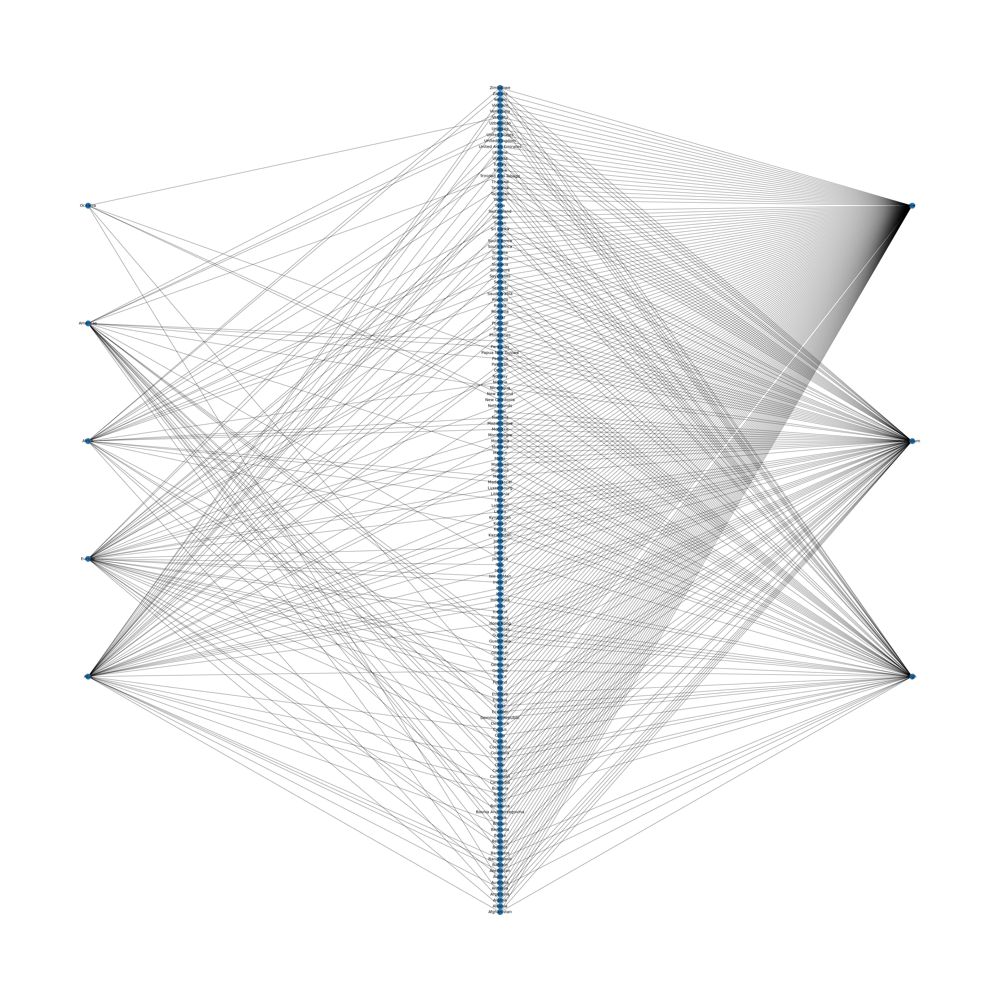

In [261]:
# Country list:
top=[] 
for node in B.nodes():
  if B.nodes[node]['bipartite']==0:
    top.append(node)

# Category list:
bottom=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==1:
    bottom.append(node)

# Continent list
middle=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==2:
    middle.append(node)
    
# Update position for node from each group:
pos = {}
pos.update((node, (0, index*20+40)) for index, node in enumerate(middle))
pos.update((node, (1, index)) for index, node in enumerate(top))
pos.update((node, (2, index*40+40)) for index, node in enumerate(bottom))

# Draw the graph:
plt.figure(figsize=(70,70))
nx.draw(B, pos=pos,with_labels = True,node_size=800,font_size=20)
plt.show()

### Number of degrees of each price category:

In [262]:
B.degree('low')

139

In [263]:
B.degree('medium')

89

In [264]:
B.degree('high')

64

## Asia's bipartite graph:

In [265]:
countries_in_asia = []
for country in df_country_continent_dict:
  if(df_country_continent_dict[country] == "Asia"):
    countries_in_asia.append(country)

countries_in_asia

['Afghanistan',
 'Armenia',
 'Azerbaijan',
 'Bahrain',
 'Bangladesh',
 'Bhutan',
 'Brunei',
 'Cambodia',
 'China',
 'Cyprus',
 'Georgia',
 'Hong Kong',
 'India',
 'Indonesia',
 'Iran',
 'Iraq',
 'Israel',
 'Japan',
 'Jordan',
 'Kazakhstan',
 'Kuwait',
 'Kyrgyzstan',
 'Lebanon',
 'Malaysia',
 'Maldives',
 'Mongolia',
 'Nepal',
 'Oman',
 'Pakistan',
 'Philippines',
 'Qatar',
 'Russia',
 'Saudi Arabia',
 'Singapore',
 'South Korea',
 'Sri Lanka',
 'Syria',
 'Taiwan',
 'Tajikistan',
 'Thailand',
 'Turkey',
 'United Arab Emirates',
 'Uzbekistan',
 'Vietnam',
 'Yemen']

In [266]:
Asia_G = nx.subgraph_view(B,filter_node=lambda x: x in countries_in_asia or x in ['high', 'medium', 'low', 'Asia'])

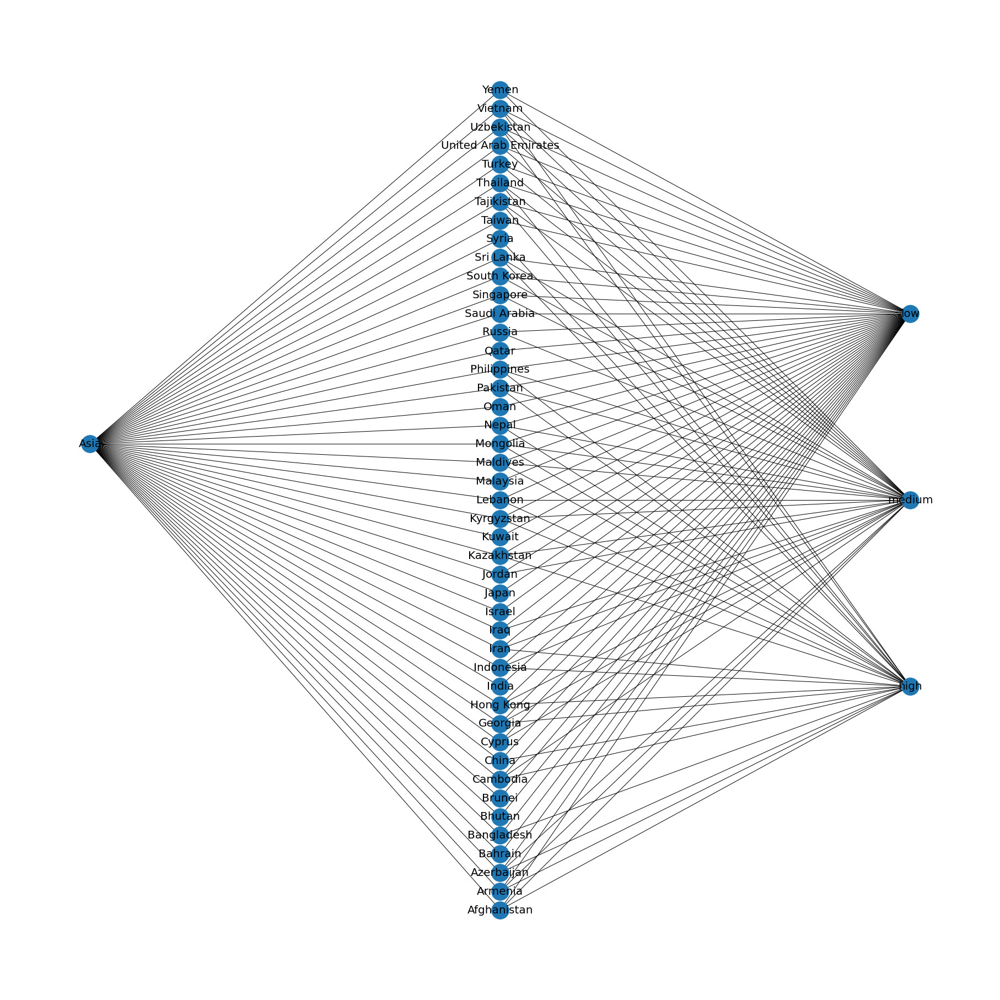

In [267]:
# Country list:
top=[] 
for node in countries_in_asia:
      top.append(node)

# Category list:
bottom=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==1:
    bottom.append(node)

# Continent list
middle=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==2:
    middle.append(node)
    
# Update position for node from each group:
pos = {}
pos.update((node, (0, index+25)) for index, node in enumerate(middle))
pos.update((node, (1, index)) for index, node in enumerate(top))
pos.update((node, (2, index*10+12)) for index, node in enumerate(bottom))

# Draw the graph:
plt.figure(figsize=(25,25))
nx.draw(Asia_G, pos=pos,with_labels = True,node_size=1000,font_size=20)
plt.show()

## Americas bipartite graph:

In [268]:
countries_in_americas = []
for country in df_country_continent_dict:
  if(df_country_continent_dict[country] == "Americas"):
    countries_in_americas.append(country)

countries_in_americas

['Argentina',
 'Barbados',
 'Belize',
 'Bermuda',
 'Bolivia',
 'Brazil',
 'Canada',
 'Chile',
 'Colombia',
 'Costa Rica',
 'Cuba',
 'Dominican Republic',
 'Ecuador',
 'Guatemala',
 'Guyana',
 'Honduras',
 'Jamaica',
 'Mexico',
 'Nicaragua',
 'Panama',
 'Paraguay',
 'Peru',
 'Trinidad And Tobago',
 'United States',
 'Uruguay',
 'Venezuela']

In [269]:
Americas_G = nx.subgraph_view(B,filter_node=lambda x: x in countries_in_americas or x in ['high', 'medium', 'low', 'Americas'])

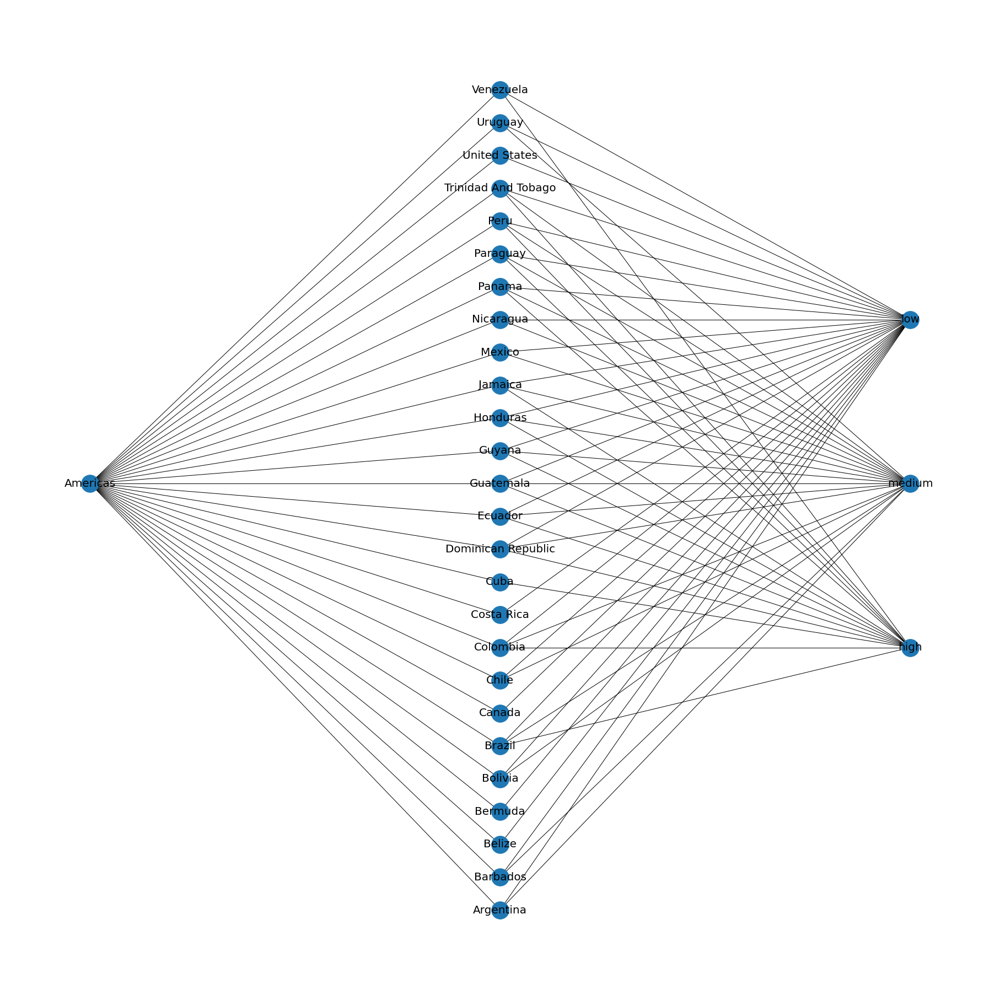

In [270]:
# Country list:
top=[] 
for node in countries_in_americas:
      top.append(node)

# Category list:
bottom=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==1:
    bottom.append(node)

# Continent list
middle=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==2:
    middle.append(node)
    
# Update position for node from each group:
pos = {}
pos.update((node, (0, index+10)) for index, node in enumerate(middle))
pos.update((node, (1, index)) for index, node in enumerate(top))
pos.update((node, (2, index*5+8)) for index, node in enumerate(bottom))

# Draw the graph:
plt.figure(figsize=(25,25))
nx.draw(Americas_G, pos=pos,with_labels = True,node_size=1000,font_size=20)
plt.show()

## Europe bipartite graph:

In [271]:
countries_in_europe = []
for country in df_country_continent_dict:
  if(df_country_continent_dict[country] == "Europe"):
    countries_in_europe.append(country)

countries_in_europe

['Albania',
 'Austria',
 'Belarus',
 'Belgium',
 'Bosnia And Herzegovina',
 'Bulgaria',
 'Croatia',
 'Denmark',
 'Estonia',
 'Finland',
 'France',
 'Germany',
 'Gibraltar',
 'Greece',
 'Hungary',
 'Iceland',
 'Ireland',
 'Isle Of Man',
 'Italy',
 'Jersey',
 'Latvia',
 'Lithuania',
 'Luxembourg',
 'Malta',
 'Moldova',
 'Montenegro',
 'Netherlands',
 'Norway',
 'Poland',
 'Portugal',
 'Romania',
 'Serbia',
 'Slovakia',
 'Slovenia',
 'Spain',
 'Sweden',
 'Switzerland',
 'Ukraine',
 'United Kingdom']

In [272]:
Europe_G = nx.subgraph_view(B,filter_node=lambda x: x in countries_in_europe or x in ['high', 'medium', 'low', 'Europe'])

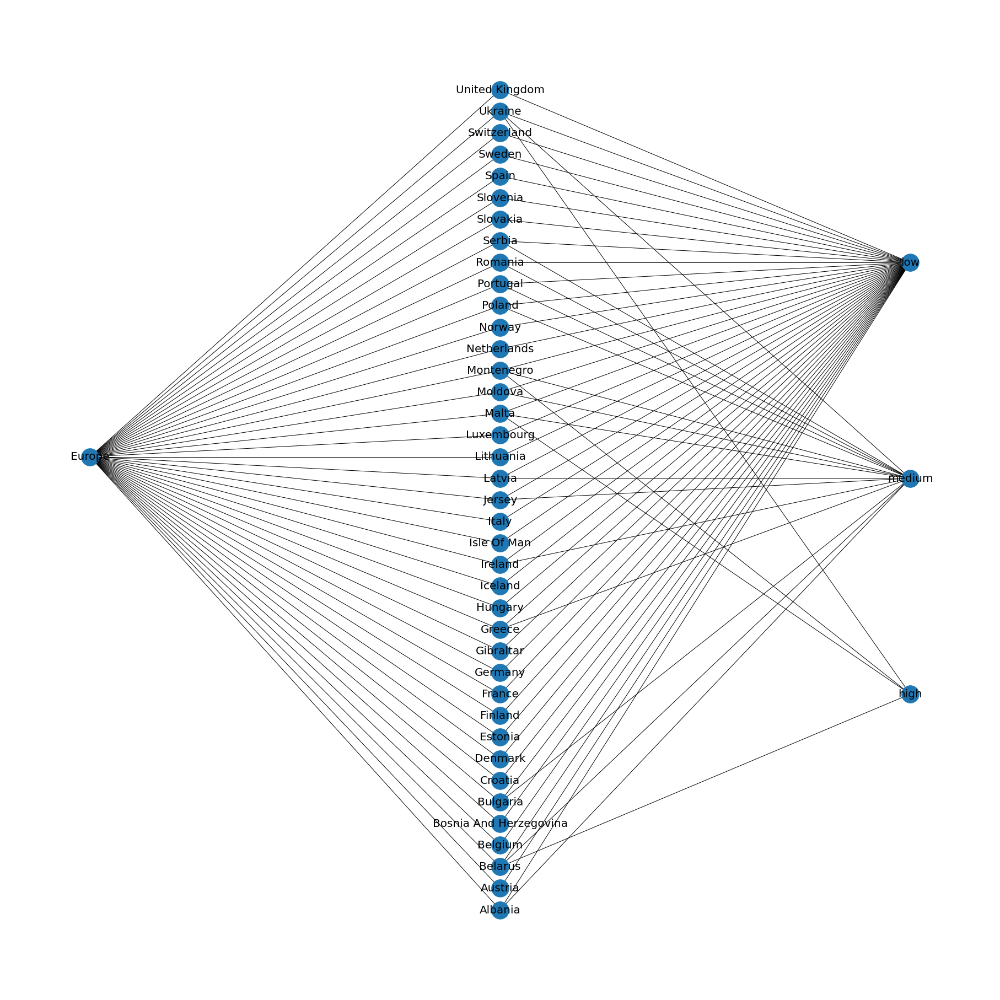

In [273]:
# Country list:
top=[] 
for node in countries_in_europe:
      top.append(node)

# Category list:
bottom=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==1:
    bottom.append(node)

# Continent list
middle=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==2:
    middle.append(node)
    
# Update position for node from each group:
pos = {}
pos.update((node, (0, index+20)) for index, node in enumerate(middle))
pos.update((node, (1, index)) for index, node in enumerate(top))
pos.update((node, (2, index*10+10)) for index, node in enumerate(bottom))

# Draw the graph:
plt.figure(figsize=(25,25))
nx.draw(Europe_G, pos=pos,with_labels = True,node_size=1000,font_size=20)
plt.show()

## Africas bipartite graph:

In [274]:
countries_in_africa = []
for country in df_country_continent_dict:
  if(df_country_continent_dict[country] == "Africa"):
    countries_in_africa.append(country)

countries_in_africa

['Algeria',
 'Botswana',
 'Cameroon',
 'Egypt',
 'Ethiopia',
 'Ghana',
 'Kenya',
 'Libya',
 'Madagascar',
 'Malawi',
 'Morocco',
 'Mozambique',
 'Namibia',
 'Nigeria',
 'Rwanda',
 'Senegal',
 'Seychelles',
 'Somalia',
 'South Africa',
 'Sudan',
 'Tanzania',
 'Tunisia',
 'Uganda',
 'Zambia',
 'Zimbabwe']

In [275]:
Africa_G = nx.subgraph_view(B,filter_node=lambda x: x in countries_in_africa or x in ['high', 'medium', 'low', 'Africa'])

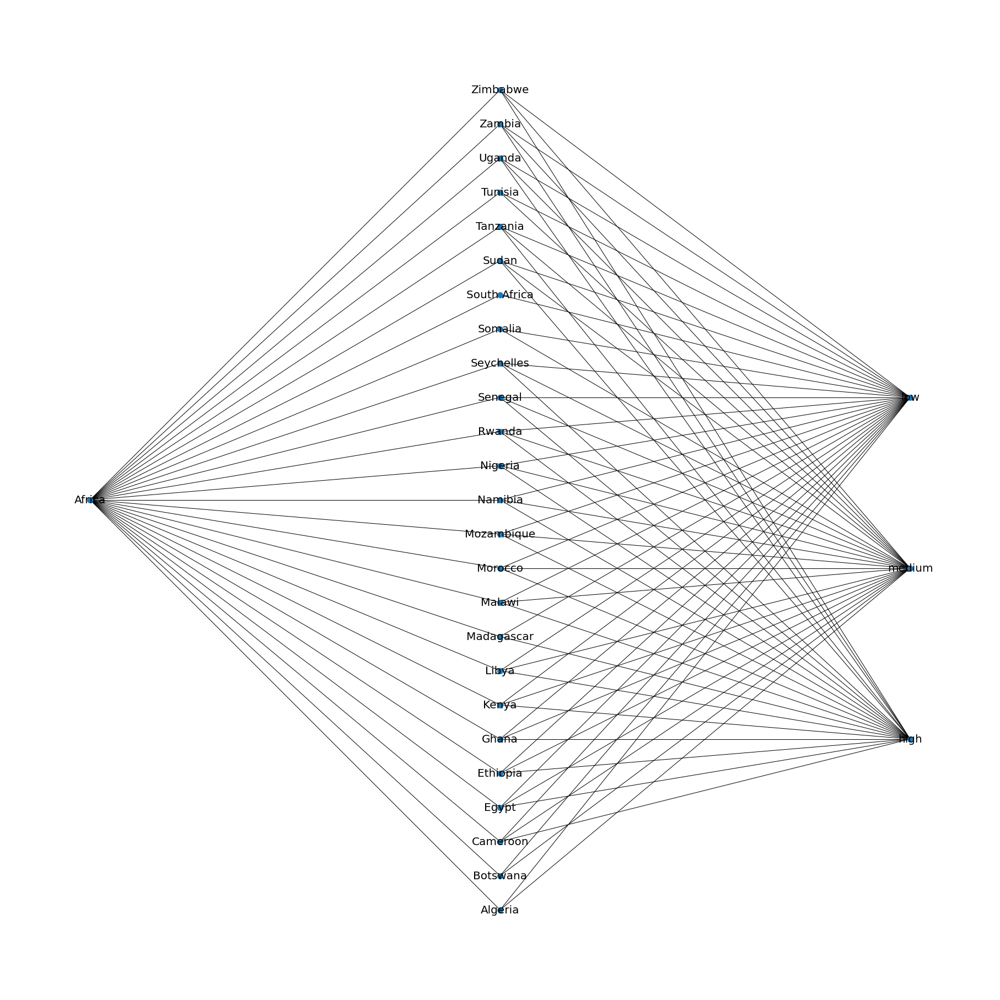

In [276]:
# Country list:
top=[] 
for node in countries_in_africa:
      top.append(node)

# Category list:
bottom=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==1:
    bottom.append(node)

# Continent list
middle=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==2:
    middle.append(node)
    
# Update position for node from each group:
pos = {}
pos.update((node, (0, index+10)) for index, node in enumerate(middle))
pos.update((node, (1, index)) for index, node in enumerate(top))
pos.update((node, (2, index*5+5)) for index, node in enumerate(bottom))

# Draw the graph:
plt.figure(figsize=(25,25))
nx.draw(Africa_G, pos=pos,with_labels = True,node_size=100,font_size=20)
plt.show()

## Oceania's bipartite graph:

In [277]:
countries_in_oceania = []
for country in df_country_continent_dict:
  if(df_country_continent_dict[country] == "Oceania"):
    countries_in_oceania.append(country)

countries_in_oceania

['Australia',
 'Fiji',
 'New Caledonia',
 'New Zealand',
 'Papua New Guinea',
 'Vanuatu']

In [278]:
Oceania_G = nx.subgraph_view(B,filter_node=lambda x: x in countries_in_oceania or x in ['high', 'medium', 'low', 'Oceania'])

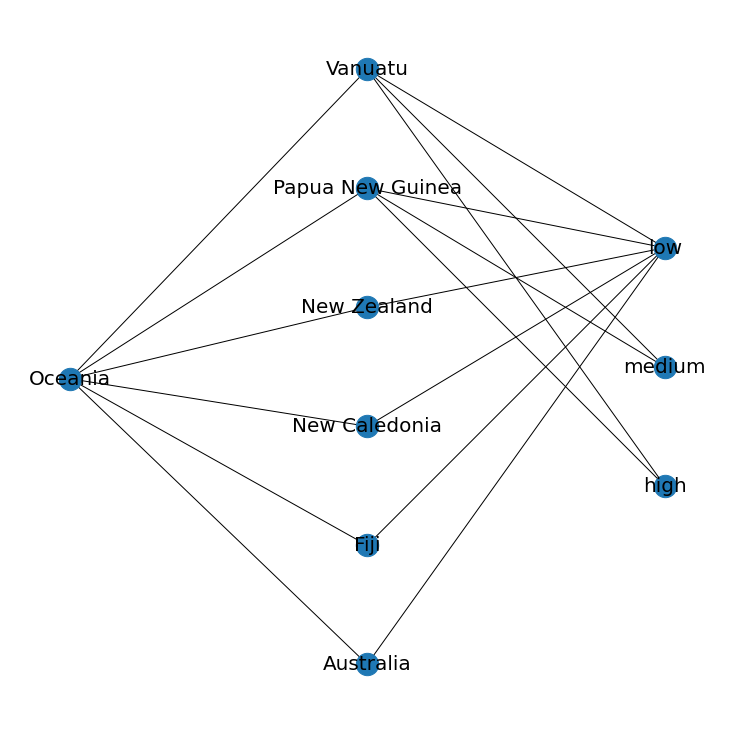

In [279]:
# Country list:
top=[] 
for node in countries_in_oceania:
      top.append(node)

# Category list:
bottom=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==1:
    bottom.append(node)

# Continent list
middle=[]
for node in B.nodes():
  if B.nodes[node]['bipartite']==2:
    middle.append(node)
    
# Update position for node from each group:
pos = {}
pos.update((node, (0, index-3.2)) for index, node in enumerate(middle))
pos.update((node, (1, index/3)) for index, node in enumerate(top))
pos.update((node, (2, index/3+0.5)) for index, node in enumerate(bottom))

# Draw the graph:
plt.figure(figsize=(10,10))
nx.draw(Oceania_G, pos=pos,with_labels = True,node_size=500,font_size=20)
plt.show()

# Degree of each category per continent:

## Asia_G degree of each category

In [280]:
asia_to_low = Asia_G.degree('low')
asia_to_medium = Asia_G.degree('medium')
asia_to_high = Asia_G.degree('high')

print(asia_to_low,asia_to_medium,asia_to_high)

44 30 24


## Americas_G degree of each category

In [281]:
americas_to_low = Americas_G.degree('low')
americas_to_medium = Americas_G.degree('medium')
americas_to_high = Americas_G.degree('high')

print(americas_to_low,americas_to_medium,americas_to_high)

25 19 14


## Europe_G degree of each category

In [282]:
europe_to_low = Europe_G.degree('low')
europe_to_medium = Europe_G.degree('medium')
europe_to_high = Europe_G.degree('high')

print(europe_to_low,europe_to_medium,europe_to_high)

39 15 4


## Africa_G degree of each category

In [283]:
africa_to_low = Africa_G.degree('low')
africa_to_medium = Africa_G.degree('medium')
africa_to_high = Africa_G.degree('high')

print(africa_to_low,africa_to_medium,africa_to_high)

25 23 20


## Oceania_G degree of each category

In [284]:
oceania_to_low = Oceania_G.degree('low')
oceania_to_medium = Oceania_G.degree('medium')
oceania_to_high = Oceania_G.degree('high')

print(oceania_to_low,oceania_to_medium,oceania_to_high)

6 2 2


# Counting number of occurences:

In [285]:
from collections import Counter

**High price country list:**

In [286]:
# Counting each country's occurence in the list:
high_country_amount = Counter(high_list)

# Sorting by most common descending order
high_country_amount.most_common()

[('Cuba', 10),
 ('Syria', 10),
 ('Madagascar', 8),
 ('Venezuela', 8),
 ('Ethiopia', 7),
 ('Sudan', 7),
 ('Papua New Guinea', 6),
 ('Tajikistan', 6),
 ('Zimbabwe', 6),
 ('Nigeria', 6),
 ('Uganda', 6),
 ('Mozambique', 5),
 ('Cambodia', 5),
 ('Vanuatu', 5),
 ('Lebanon', 4),
 ('Seychelles', 4),
 ('Ghana', 4),
 ('Sri Lanka', 4),
 ('Tanzania', 4),
 ('Malawi', 4),
 ('Senegal', 4),
 ('Egypt', 3),
 ('Rwanda', 3),
 ('Zambia', 3),
 ('Kyrgyzstan', 3),
 ('Mongolia', 3),
 ('Philippines', 3),
 ('Thailand', 3),
 ('Armenia', 3),
 ('Dominican Republic', 3),
 ('Georgia', 3),
 ('Guatemala', 3),
 ('Uzbekistan', 3),
 ('Nepal', 2),
 ('Pakistan', 2),
 ('Indonesia', 2),
 ('Kenya', 2),
 ('Vietnam', 2),
 ('Iran', 2),
 ('Maldives', 2),
 ('Montenegro', 2),
 ('Paraguay', 2),
 ('Bangladesh', 1),
 ('Afghanistan', 1),
 ('Belarus', 1),
 ('China', 1),
 ('Azerbaijan', 1),
 ('Brazil', 1),
 ('Cameroon', 1),
 ('Colombia', 1),
 ('Ecuador', 1),
 ('Guyana', 1),
 ('Honduras', 1),
 ('Hong Kong', 1),
 ('Jamaica', 1),
 ('Kazakhsta

**Medium price country list:**

In [287]:
# Counting each country's occurence in the list:
medium_country_amount = Counter(med_list)

# Sorting by most common descending order
medium_country_amount.most_common()

[('Guyana', 6),
 ('Kazakhstan', 6),
 ('Nicaragua', 6),
 ('Honduras', 6),
 ('Azerbaijan', 5),
 ('Brazil', 5),
 ('Jamaica', 5),
 ('Libya', 5),
 ('Nepal', 5),
 ('Panama', 5),
 ('Colombia', 5),
 ('Ecuador', 5),
 ('Peru', 5),
 ('Albania', 4),
 ('Armenia', 4),
 ('Cameroon', 4),
 ('Guatemala', 4),
 ('Iran', 4),
 ('Kyrgyzstan', 4),
 ('Malawi', 4),
 ('Mongolia', 4),
 ('Montenegro', 4),
 ('Paraguay', 4),
 ('Philippines', 4),
 ('Senegal', 4),
 ('Serbia', 4),
 ('Turkey', 4),
 ('Uruguay', 4),
 ('Uzbekistan', 4),
 ('Kenya', 4),
 ('Lebanon', 4),
 ('Maldives', 4),
 ('Morocco', 4),
 ('Vietnam', 4),
 ('Egypt', 4),
 ('Algeria', 3),
 ('Argentina', 3),
 ('Chile', 3),
 ('Cyprus', 3),
 ('Dominican Republic', 3),
 ('Georgia', 3),
 ('Ghana', 3),
 ('Malta', 3),
 ('Moldova', 3),
 ('Namibia', 3),
 ('Russia', 3),
 ('Trinidad And Tobago', 3),
 ('Ukraine', 3),
 ('Iraq', 3),
 ('Mozambique', 3),
 ('Seychelles', 3),
 ('Thailand', 3),
 ('Tanzania', 3),
 ('Hong Kong', 3),
 ('Indonesia', 3),
 ('Portugal', 3),
 ('Cambodia'

**Low price country list:**

In [288]:
# Counting each country's occurence in the list:
low_country_amount = Counter(low_list)

# Sorting by most common descending order
low_country_amount.most_common()

[('Australia', 10),
 ('Austria', 10),
 ('Bahrain', 10),
 ('Belgium', 10),
 ('Bermuda', 10),
 ('Bhutan', 10),
 ('Bosnia And Herzegovina', 10),
 ('Brunei', 10),
 ('Canada', 10),
 ('Costa Rica', 10),
 ('Croatia', 10),
 ('Denmark', 10),
 ('Estonia', 10),
 ('Fiji', 10),
 ('Finland', 10),
 ('France', 10),
 ('Germany', 10),
 ('Gibraltar', 10),
 ('Hungary', 10),
 ('Iceland', 10),
 ('India', 10),
 ('Isle Of Man', 10),
 ('Israel', 10),
 ('Italy', 10),
 ('Japan', 10),
 ('Kuwait', 10),
 ('Lithuania', 10),
 ('Luxembourg', 10),
 ('Malaysia', 10),
 ('Netherlands', 10),
 ('New Caledonia', 10),
 ('New Zealand', 10),
 ('Norway', 10),
 ('Oman', 10),
 ('Qatar', 10),
 ('Saudi Arabia', 10),
 ('Slovakia', 10),
 ('Slovenia', 10),
 ('South Africa', 10),
 ('Spain', 10),
 ('Sweden', 10),
 ('Switzerland', 10),
 ('Taiwan', 10),
 ('United Kingdom', 10),
 ('United States', 10),
 ('Bangladesh', 9),
 ('Belize', 9),
 ('Bolivia', 9),
 ('China', 9),
 ('Ireland', 9),
 ('Jordan', 9),
 ('Latvia', 9),
 ('Poland', 9),
 ('Sing

**Taking top 20 countries from each category:**

In [289]:
highest_20_countries = high_country_amount.most_common(20)
highest_20_countries

[('Cuba', 10),
 ('Syria', 10),
 ('Madagascar', 8),
 ('Venezuela', 8),
 ('Ethiopia', 7),
 ('Sudan', 7),
 ('Papua New Guinea', 6),
 ('Tajikistan', 6),
 ('Zimbabwe', 6),
 ('Nigeria', 6),
 ('Uganda', 6),
 ('Mozambique', 5),
 ('Cambodia', 5),
 ('Vanuatu', 5),
 ('Lebanon', 4),
 ('Seychelles', 4),
 ('Ghana', 4),
 ('Sri Lanka', 4),
 ('Tanzania', 4),
 ('Malawi', 4)]

In [290]:
medium_20_countries = medium_country_amount.most_common(20)
medium_20_countries

[('Guyana', 6),
 ('Kazakhstan', 6),
 ('Nicaragua', 6),
 ('Honduras', 6),
 ('Azerbaijan', 5),
 ('Brazil', 5),
 ('Jamaica', 5),
 ('Libya', 5),
 ('Nepal', 5),
 ('Panama', 5),
 ('Colombia', 5),
 ('Ecuador', 5),
 ('Peru', 5),
 ('Albania', 4),
 ('Armenia', 4),
 ('Cameroon', 4),
 ('Guatemala', 4),
 ('Iran', 4),
 ('Kyrgyzstan', 4),
 ('Malawi', 4)]

In [291]:
lowest_20_countries = low_country_amount.most_common(20)
lowest_20_countries

[('Australia', 10),
 ('Austria', 10),
 ('Bahrain', 10),
 ('Belgium', 10),
 ('Bermuda', 10),
 ('Bhutan', 10),
 ('Bosnia And Herzegovina', 10),
 ('Brunei', 10),
 ('Canada', 10),
 ('Costa Rica', 10),
 ('Croatia', 10),
 ('Denmark', 10),
 ('Estonia', 10),
 ('Fiji', 10),
 ('Finland', 10),
 ('France', 10),
 ('Germany', 10),
 ('Gibraltar', 10),
 ('Hungary', 10),
 ('Iceland', 10)]

# Salary diagram:

## Salaries of highest country diagram:

In [292]:
highest_salaries_df = df[['country','x54']].nlargest(20, ['x54'])
highest_salaries_df

,country,x54
14,Bermuda,5973.810000
119,Switzerland,5891.950909
57,Isle Of Man,4547.650000
109,Singapore,4497.080000
132,United States,4472.546471
72,Luxembourg,4135.590000
5,Australia,3761.692000
91,Norway,3566.805714
32,Denmark,3352.186000
51,Iceland,3331.490000


In [293]:
highest_salaries_countries_names = list(highest_salaries_df['country'])
highest_salaries_countries_names

['Bermuda',
 'Switzerland',
 'Isle Of Man',
 'Singapore',
 'United States',
 'Luxembourg',
 'Australia',
 'Norway',
 'Denmark',
 'Iceland',
 'Qatar',
 'Gibraltar',
 'New Zealand',
 'Canada',
 'Netherlands',
 'United Arab Emirates',
 'Hong Kong',
 'Jersey',
 'Germany',
 'Finland']

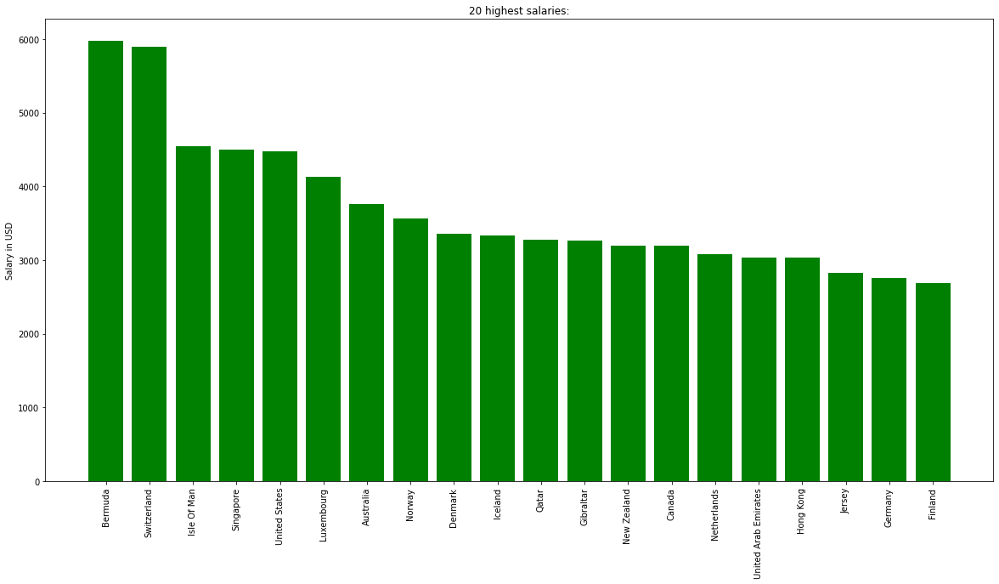

In [294]:
plt.figure(figsize=(20,10))
plt.bar(highest_salaries_df['country'], highest_salaries_df['x54'], color = 'green')
plt.ylabel('Salary in USD')
plt.title('20 highest salaries:')
plt.xticks(rotation=90)

plt.show()

## Salaries of lowest country diagram:

In [295]:
lowest_salaries_df = df[['country','x54']].nsmallest(20, ['x54'])
lowest_salaries_df

,country,x54
30,Cuba,35.750000
120,Syria,50.240000
73,Madagascar,142.590000
117,Sudan,148.570000
116,Sri Lanka,156.070000
35,Egypt,160.745000
128,Uganda,162.070000
93,Pakistan,162.403333
122,Tajikistan,164.270000
43,Ghana,181.720000


In [296]:
lowest_salaries_countries_names = list(lowest_salaries_df['country'])
lowest_salaries_countries_names

['Cuba',
 'Syria',
 'Madagascar',
 'Sudan',
 'Sri Lanka',
 'Egypt',
 'Uganda',
 'Pakistan',
 'Tajikistan',
 'Ghana',
 'Afghanistan',
 'Ethiopia',
 'Venezuela',
 'Nigeria',
 'Nepal',
 'Bangladesh',
 'Algeria',
 'Tunisia',
 'Mozambique',
 'Tanzania']

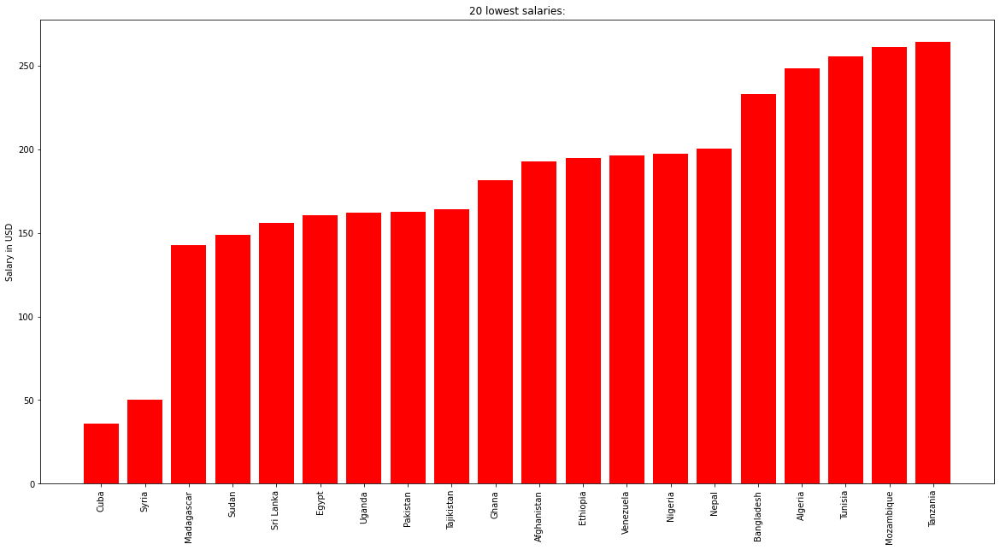

In [297]:
plt.figure(figsize=(20,10))
plt.bar(lowest_salaries_df['country'], lowest_salaries_df['x54'], color = 'red')
plt.ylabel('Salary in USD')
plt.title('20 lowest salaries:')
plt.xticks(rotation=90)

plt.show()

# Making the projected graphs:

## Making the nodes correspond to their number of occurences in each list:

In [319]:
# Highest 20 countries list:
highest_node_size = []
highest_node_color = []

for i in range(len(highest_20_countries)):
  if highest_20_countries[i][1] > 8: 
    highest_node_size.append(highest_20_countries[i][1] * 600)
    highest_node_color.append("#fa0000")
  elif highest_20_countries[i][1] > 7:
    highest_node_size.append(highest_20_countries[i][1] * 400)
    highest_node_color.append("#fa4f00")
  else:
    highest_node_size.append(highest_20_countries[i][1] * 200)
    highest_node_color.append("#c7bd08")



In [320]:
# Medium 20 countries list:
medium_node_size = []
medium_node_color = []

for i in range(len(medium_20_countries)):
    medium_node_size.append(medium_20_countries[i][1] * 600)
    medium_node_color.append("#ded828")

In [321]:
# Lowest 20 countries list:
lowest_node_size = []
lowest_node_color = []

for i in range(len(lowest_20_countries)):
  if lowest_20_countries[i][1] > 4:
    lowest_node_size.append(lowest_20_countries[i][1] * 600)
    lowest_node_color.append("#53eb17")
  else:
    lowest_node_size.append(lowest_20_countries[i][1] * 300)
    lowest_node_color.append("#099c8d")

## Relabeling the nodes:

In [322]:
# Relabel the nodes:
high_mapping = {}
medium_mapping = {}
low_mapping = {}

for i in range(len(highest_20_countries)):
  high_mapping[highest_20_countries[i]] = highest_20_countries[i][0]

for i in range(len(medium_20_countries)):
  medium_mapping[medium_20_countries[i]] = medium_20_countries[i][0]

for i in range(len(lowest_20_countries)):
  low_mapping[lowest_20_countries[i]] = lowest_20_countries[i][0]

low_mapping

{('Australia', 10): 'Australia',
 ('Austria', 10): 'Austria',
 ('Bahrain', 10): 'Bahrain',
 ('Belgium', 10): 'Belgium',
 ('Bermuda', 10): 'Bermuda',
 ('Bhutan', 10): 'Bhutan',
 ('Bosnia And Herzegovina', 10): 'Bosnia And Herzegovina',
 ('Brunei', 10): 'Brunei',
 ('Canada', 10): 'Canada',
 ('Costa Rica', 10): 'Costa Rica',
 ('Croatia', 10): 'Croatia',
 ('Denmark', 10): 'Denmark',
 ('Estonia', 10): 'Estonia',
 ('Fiji', 10): 'Fiji',
 ('Finland', 10): 'Finland',
 ('France', 10): 'France',
 ('Germany', 10): 'Germany',
 ('Gibraltar', 10): 'Gibraltar',
 ('Hungary', 10): 'Hungary',
 ('Iceland', 10): 'Iceland'}

# Projected graphs results:

## High price Graph:

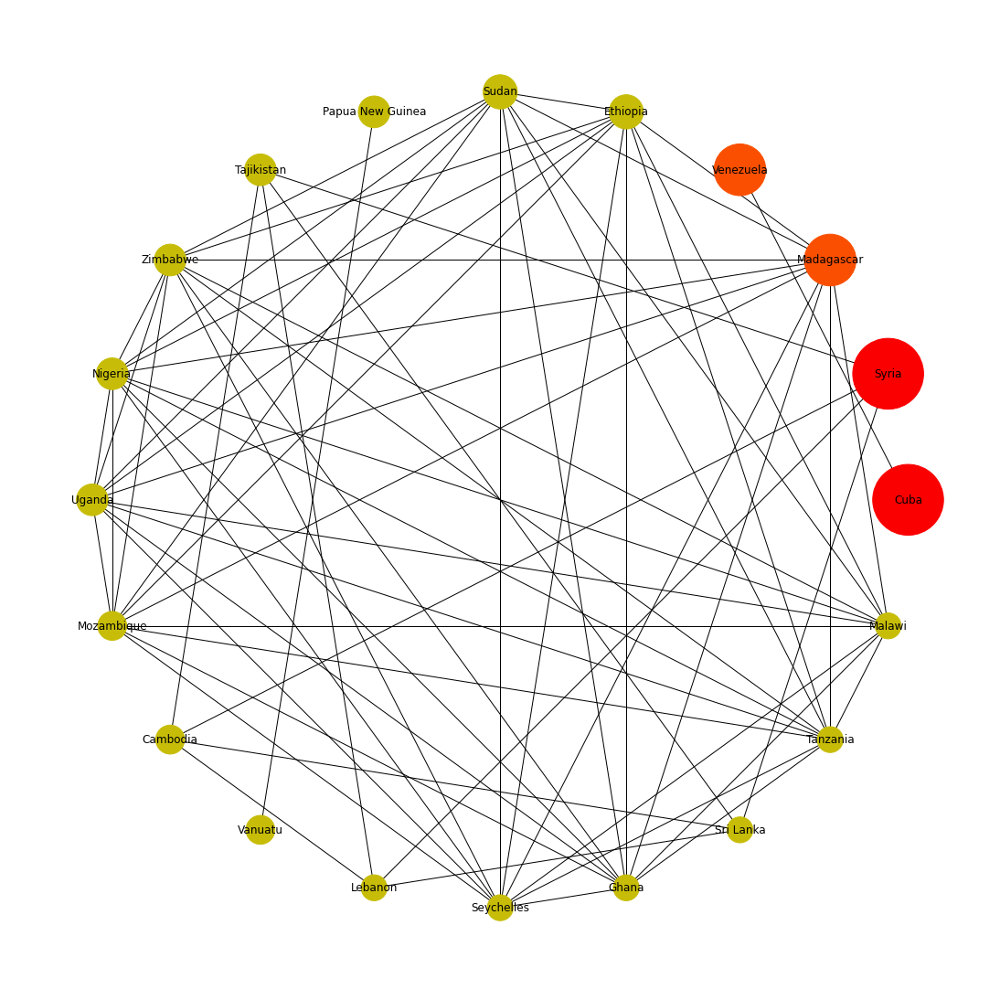

In [323]:
# create a graph for highest 20 countries:
high_price_G = nx.Graph()
high_price_G.add_nodes_from(highest_20_countries)
high_price_G = nx.relabel_nodes(high_price_G, high_mapping)

# Adding an edge if the coutnries are in the same continent:
for country1 in high_price_G.nodes():
  for country2 in high_price_G.nodes():
    if country1 != country2:
      if df_country_continent_dict[country1] == df_country_continent_dict[country2]:
        high_price_G.add_edge(country1,country2)


# Draw the circular graph:
plt.figure(figsize=(15,15))
high_price_G2 = nx.relabel_nodes(high_price_G, high_mapping)
nx.draw(high_price_G, pos = nx.circular_layout(high_price_G), with_labels = True, node_size = highest_node_size, node_color = highest_node_color)

## Medium Price Graph:

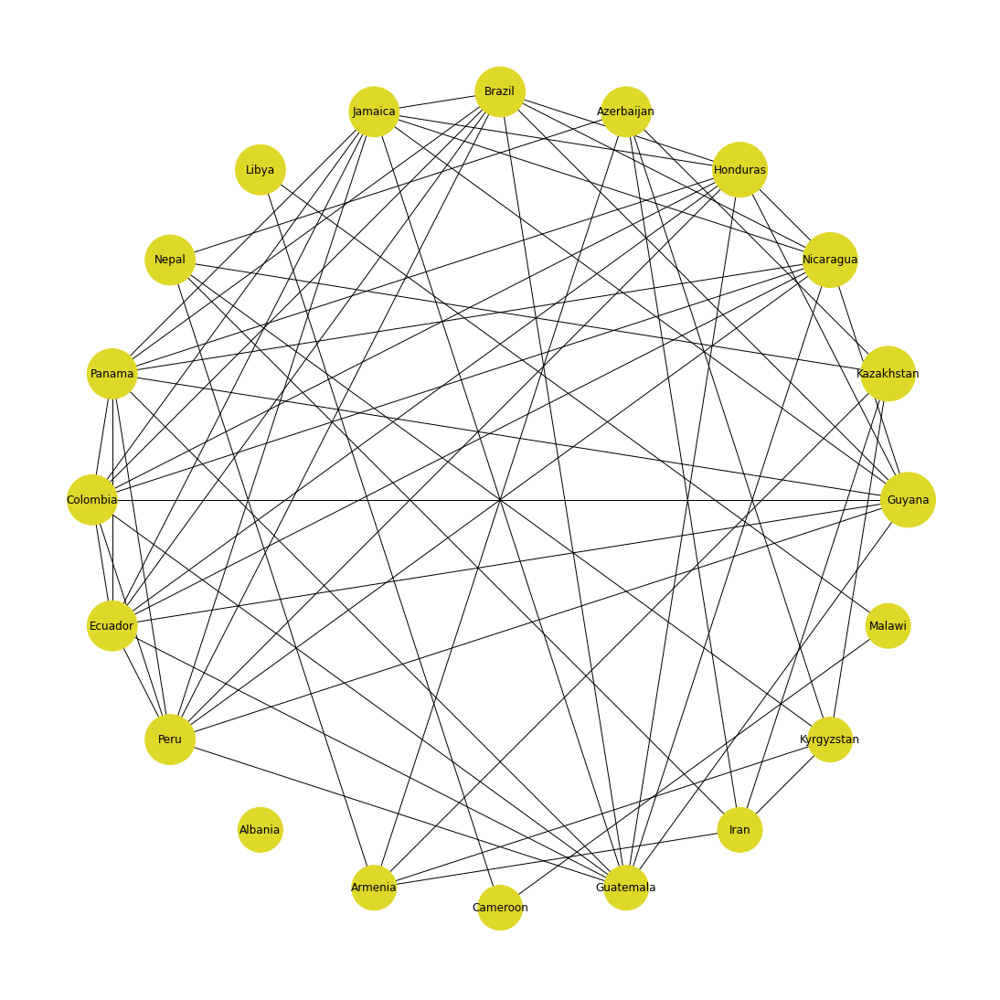

In [324]:
# create a graph for medium 20 countries:
medium_price_G = nx.Graph()
medium_price_G.add_nodes_from(medium_20_countries)
medium_price_G = nx.relabel_nodes(medium_price_G, medium_mapping)

# Adding an edge if the coutnries are in the same continent:
for country1 in medium_price_G.nodes():
  for country2 in medium_price_G.nodes():
    if country1 != country2:
      if df_country_continent_dict[country1] == df_country_continent_dict[country2]:
        medium_price_G.add_edge(country1,country2)

# Draw the circular graph:
plt.figure(figsize=(15,15))
medium_price_G = nx.relabel_nodes(medium_price_G, medium_mapping)
nx.draw(medium_price_G, pos = nx.circular_layout(medium_price_G), with_labels = True, node_size = medium_node_size, node_color = medium_node_color)

## Low price Graph:

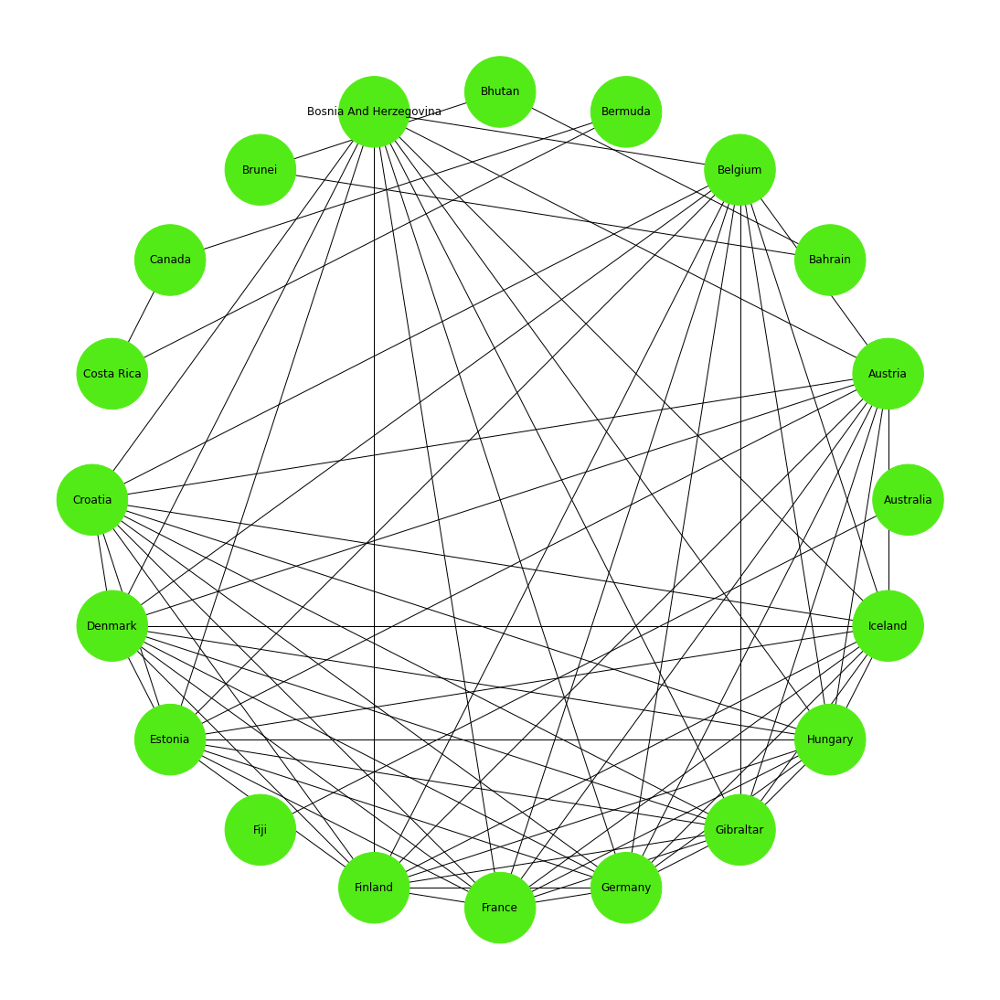

In [325]:
# create a graph for lowest 20 countries:
low_price_G = nx.Graph()
low_price_G.add_nodes_from(lowest_20_countries)
low_price_G = nx.relabel_nodes(low_price_G, low_mapping)

# Adding an edge if the coutnries are in the same continent:
for country1 in low_price_G.nodes():
  for country2 in low_price_G.nodes():
    if country1 != country2:
      if df_country_continent_dict[country1] == df_country_continent_dict[country2]:
        low_price_G.add_edge(country1,country2)


# Draw the circular graph:
plt.figure(figsize=(15,15))
low_price_G = nx.relabel_nodes(low_price_G, low_mapping)
nx.draw(low_price_G, pos = nx.circular_layout(low_price_G), with_labels = True, node_size = lowest_node_size, node_color = lowest_node_color)

## Cliques:

In [326]:
# Function to find the biggest clique:
def FindMaxLength(lst):
    maxList = max(lst, key = lambda i: len(i))
    maxLength = len(maxList)
    continent = df_country_continent_dict[maxList[0]]
    return maxList, maxLength, continent

### high_price_G clique:

In [327]:
# Finding cliques in high_price_G:
high_price_cliques = list(nx.find_cliques(high_price_G))
high_price_cliques

[['Papua New Guinea', 'Vanuatu'],
 ['Lebanon', 'Cambodia', 'Tajikistan', 'Syria', 'Sri Lanka'],
 ['Nigeria',
  'Sudan',
  'Ethiopia',
  'Malawi',
  'Uganda',
  'Mozambique',
  'Zimbabwe',
  'Tanzania',
  'Ghana',
  'Seychelles',
  'Madagascar'],
 ['Cuba', 'Venezuela']]

In [328]:
# Biggest clique in high_price_G:
FindMaxLength(high_price_cliques)

(['Nigeria',
  'Sudan',
  'Ethiopia',
  'Malawi',
  'Uganda',
  'Mozambique',
  'Zimbabwe',
  'Tanzania',
  'Ghana',
  'Seychelles',
  'Madagascar'],
 11,
 'Africa')

In [329]:
# Closeness centraility of high_price_G:
closeness_centrality_high_dict = nx.closeness_centrality(high_price_G)
sorted_closeness_centrality_high_dict = {k: v for k, v in sorted(closeness_centrality_high_dict.items(), key=lambda item: item[1],reverse = True)}
sorted_closeness_centrality_high_dict

{'Madagascar': 0.5263157894736842,
 'Ethiopia': 0.5263157894736842,
 'Sudan': 0.5263157894736842,
 'Zimbabwe': 0.5263157894736842,
 'Nigeria': 0.5263157894736842,
 'Uganda': 0.5263157894736842,
 'Mozambique': 0.5263157894736842,
 'Seychelles': 0.5263157894736842,
 'Ghana': 0.5263157894736842,
 'Tanzania': 0.5263157894736842,
 'Malawi': 0.5263157894736842,
 'Syria': 0.21052631578947367,
 'Tajikistan': 0.21052631578947367,
 'Cambodia': 0.21052631578947367,
 'Lebanon': 0.21052631578947367,
 'Sri Lanka': 0.21052631578947367,
 'Cuba': 0.05263157894736842,
 'Venezuela': 0.05263157894736842,
 'Papua New Guinea': 0.05263157894736842,
 'Vanuatu': 0.05263157894736842}

### meidum_price_G clique:

In [330]:
# Finding cliques in the graph:
medium_price_cliques = list(nx.find_cliques(medium_price_G))
medium_price_cliques

[['Brazil',
  'Guyana',
  'Panama',
  'Nicaragua',
  'Peru',
  'Guatemala',
  'Ecuador',
  'Honduras',
  'Jamaica',
  'Colombia'],
 ['Iran', 'Azerbaijan', 'Nepal', 'Armenia', 'Kyrgyzstan', 'Kazakhstan'],
 ['Albania'],
 ['Malawi', 'Cameroon', 'Libya']]

In [331]:
# Biggest clique in medium_price_G:
FindMaxLength(medium_price_cliques)

(['Brazil',
  'Guyana',
  'Panama',
  'Nicaragua',
  'Peru',
  'Guatemala',
  'Ecuador',
  'Honduras',
  'Jamaica',
  'Colombia'],
 10,
 'Americas')

In [332]:
# Closeness centraility of medium_price_G:
closeness_centrality_medium_dict = nx.closeness_centrality(medium_price_G)
sorted_closeness_centrality_medium_dict = {k: v for k, v in sorted(closeness_centrality_medium_dict.items(), key=lambda item: item[1],reverse = True)}
sorted_closeness_centrality_medium_dict

{'Guyana': 0.47368421052631576,
 'Nicaragua': 0.47368421052631576,
 'Honduras': 0.47368421052631576,
 'Brazil': 0.47368421052631576,
 'Jamaica': 0.47368421052631576,
 'Panama': 0.47368421052631576,
 'Colombia': 0.47368421052631576,
 'Ecuador': 0.47368421052631576,
 'Peru': 0.47368421052631576,
 'Guatemala': 0.47368421052631576,
 'Kazakhstan': 0.2631578947368421,
 'Azerbaijan': 0.2631578947368421,
 'Nepal': 0.2631578947368421,
 'Armenia': 0.2631578947368421,
 'Iran': 0.2631578947368421,
 'Kyrgyzstan': 0.2631578947368421,
 'Libya': 0.10526315789473684,
 'Cameroon': 0.10526315789473684,
 'Malawi': 0.10526315789473684,
 'Albania': 0.0}

### low_price_G clique:

In [333]:
# Finding cliques in low_price_G:
low_price_cliques = list(nx.find_cliques(low_price_G))
low_price_cliques

[['Denmark',
  'Austria',
  'Bosnia And Herzegovina',
  'Estonia',
  'Croatia',
  'Gibraltar',
  'Finland',
  'France',
  'Germany',
  'Belgium',
  'Hungary',
  'Iceland'],
 ['Bhutan', 'Brunei', 'Bahrain'],
 ['Fiji', 'Australia'],
 ['Canada', 'Costa Rica', 'Bermuda']]

In [334]:
# Biggest clique in low_price_G:
FindMaxLength(low_price_cliques)

(['Denmark',
  'Austria',
  'Bosnia And Herzegovina',
  'Estonia',
  'Croatia',
  'Gibraltar',
  'Finland',
  'France',
  'Germany',
  'Belgium',
  'Hungary',
  'Iceland'],
 12,
 'Europe')

In [335]:
# Closeness centraility of low_price_G:
closeness_centrality_low_dict = nx.closeness_centrality(low_price_G)
sorted_closeness_centrality_low_dict = {k: v for k, v in sorted(closeness_centrality_low_dict.items(), key=lambda item: item[1],reverse = True)}
sorted_closeness_centrality_low_dict

{'Austria': 0.5789473684210527,
 'Belgium': 0.5789473684210527,
 'Bosnia And Herzegovina': 0.5789473684210527,
 'Croatia': 0.5789473684210527,
 'Denmark': 0.5789473684210527,
 'Estonia': 0.5789473684210527,
 'Finland': 0.5789473684210527,
 'France': 0.5789473684210527,
 'Germany': 0.5789473684210527,
 'Gibraltar': 0.5789473684210527,
 'Hungary': 0.5789473684210527,
 'Iceland': 0.5789473684210527,
 'Bahrain': 0.10526315789473684,
 'Bermuda': 0.10526315789473684,
 'Bhutan': 0.10526315789473684,
 'Brunei': 0.10526315789473684,
 'Canada': 0.10526315789473684,
 'Costa Rica': 0.10526315789473684,
 'Australia': 0.05263157894736842,
 'Fiji': 0.05263157894736842}

# Number of occurences of top 20 highest salary coutries in lowest price per salary:

In [336]:
high_salary_low_price = []

for node in low_price_G.nodes():
  if node in highest_salaries_countries_names:
    high_salary_low_price.append(node)

print(f"{high_salary_low_price}, amount of appearances in low_price_G and highest_salaries_countries_names: {len(high_salary_low_price)}")

['Australia', 'Bermuda', 'Canada', 'Denmark', 'Finland', 'Germany', 'Gibraltar', 'Iceland'], amount of appearances in low_price_G and highest_salaries_countries_names: 8


# Number of occurences of top 20 highest salary coutries in highest price per salary:

In [337]:
high_salary_high_price = []

for node in high_price_G.nodes():
  if node in highest_salaries_countries_names:
    high_salary_high_price.append(node)

print(f"{high_salary_high_price}, amount of appearances in high_price_G and highest_salaries_countries_names: {len(high_salary_high_price)}")

[], amount of appearances in high_price_G and highest_salaries_countries_names: 0


# Number of occurences of top 20 lowest salary coutries in lowest price per salary:

In [338]:
low_salary_low_price = []

for node in low_price_G.nodes():
  if node in lowest_salaries_countries_names:
    low_salary_low_price.append(node)

print(f"{low_salary_low_price}, amount of appearances in low_price_G and lowest_salaries_countries_names: {len(low_salary_low_price)}")

[], amount of appearances in low_price_G and lowest_salaries_countries_names: 0


# Number of occurences of top 20 lowest salary coutries in highest price per salary:

In [339]:
low_salary_high_price = []

for node in high_price_G.nodes():
  if node in lowest_salaries_countries_names:
    low_salary_high_price.append(node)

print(f"{low_salary_high_price}, amount of appearances in high_price_G and lowest_salaries_countries_names: {len(low_salary_high_price)}")

['Cuba', 'Syria', 'Madagascar', 'Venezuela', 'Ethiopia', 'Sudan', 'Tajikistan', 'Nigeria', 'Uganda', 'Mozambique', 'Ghana', 'Sri Lanka', 'Tanzania'], amount of appearances in high_price_G and lowest_salaries_countries_names: 13
